# **AMAZON SALES DATA ANALYSIS**

##**Importing Required Libraries:**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

## **Import dataset:**

In [2]:
sales_data=pd.read_excel("/content/SALESDATA.xls")

In [3]:
sales_data.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,...,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M,Unnamed: 20,Unnamed: 21
0,10000481,2017-04-30,-237.91,2017-04-30,100012,NaN,NaN,Urban Large Eggs,2000,0.00,...,237.91,0.00,0.0,237.91,237.910000,1,184,EA,NaN,U/M = unit of measure
1,10002220,2017-07-14,368.79,2017-07-14,100233,P01,20910,Moms Sliced Turkey,1000,824.96,...,456.17,824.96,0.0,456.17,456.170000,1,127,EA,NaN,NaN
2,10002220,2017-10-17,109.73,2017-10-17,116165,P01,38076,Cutting Edge Foot-Long Hot Dogs,1000,548.66,...,438.93,548.66,0.0,438.93,438.930000,1,127,EA,NaN,EA = each
3,10002489,2017-06-03,-211.75,2017-06-03,100096,NaN,NaN,Kiwi Lox,1000,0.00,...,211.75,0.00,0.0,211.75,211.750000,1,160,EA,NaN,NaN
4,10004516,2017-05-27,96627.94,2017-05-27,103341,P01,60776,High Top Sweet Onion,1000,408.52,...,89248.66,185876.60,0.0,89248.66,196.150901,455,124,SE,NaN,SE = some SI unit like kgs or gallons


In [4]:
#shape size
sales_data.shape

(65282, 22)

Findings:
There are total 65282 rows and 20 columns in the dataset.

In [6]:
# columns name
sales_data.columns

Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Order Number', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
       'U/M', 'Unnamed: 20', 'Unnamed: 21'],
      dtype='object')

In [7]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

Finding:
We learned the number of columns, the names of the columns, and the data type of the columns from the dataset information.

In [8]:
# Checking missing values
sales_data.isnull().sum()

CustKey                                 0
DateKey                                 0
Discount Amount                         2
Invoice Date                            0
Invoice Number                          0
Item Class                           8289
Item Number                            41
Item                                    0
Line Number                             0
List Price                              0
Order Number                            0
Promised Delivery Date                  0
Sales Amount                            0
Sales Amount Based on List Price        0
Sales Cost Amount                       0
Sales Margin Amount                     0
Sales Price                             1
Sales Quantity                          0
Sales Rep                               0
U/M                                     0
Unnamed: 20                         65282
Unnamed: 21                         65278
dtype: int64

Findings:
We can observe that several of the columns have missing values, such as Discount Amount having two missing values, Item Class having 8289, Item Number having 41 and 1 in the sales price.

In [9]:
sales_data1 = sales_data.copy()

In [10]:
sales_data1['Item Class'].value_counts()

P01    56977
PO1       16
Name: Item Class, dtype: int64

In [11]:
#generating descriptive statistics
sales_data1.describe().round()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,Unnamed: 20
count,65282.0,65280.0,65282.0,65282.0,65282.0,65282.0,65282.0,65282.0,65282.0,65282.0,65281.0,65282.0,65282.0,0.0
mean,10017703.0,1856.0,216224.0,23714.0,515.0,180583.0,2852.0,4707.0,1661.0,1191.0,284.0,45.0,137.0,NaN
std,7176.0,9037.0,94992.0,32664.0,449.0,67594.0,15164.0,20696.0,9556.0,5861.0,253.0,430.0,27.0,NaN
min,10000453.0,-255821.0,100012.0,1000.0,0.0,100838.0,200.0,0.0,0.0,-3933.0,-5000.0,-1.0,103.0,NaN
25%,10012715.0,246.0,117931.0,3000.0,182.0,115321.0,308.0,561.0,168.0,130.0,100.0,2.0,113.0,NaN
50%,10019665.0,442.0,222870.0,12000.0,325.0,203702.0,554.0,998.0,304.0,246.0,184.0,3.0,134.0,NaN
75%,10023511.0,1000.0,314319.0,32000.0,804.0,218576.0,1280.0,2315.0,687.0,580.0,448.0,8.0,160.0,NaN
max,10027583.0,343533.0,332842.0,344000.0,2761.0,321532.0,555376.0,632610.0,366576.0,188800.0,6035.0,16000.0,185.0,NaN


In [12]:
# Adding Year, Month, Quarter, and Day Columns to Sales_Data1
# I'm constructing additional columns here using the Invoice Date columns, where
# It uses the yyyy/mm/dd format.

sales_data1['Invoice_Year'] = sales_data['Invoice Date'].dt.year
sales_data1['Invoice_Month'] = sales_data['Invoice Date'].dt.month
sales_data1['Invoice_Quarter'] = sales_data['Invoice Date'].dt.quarter
sales_data1['Invoice_Day'] = sales_data['Invoice Date'].dt.day

In [13]:
sales_data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 26 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

In [14]:
# Creating DataFrame only with necessary values.
# Considering the data which is realted to sales.

sales_data2 = sales_data1[['CustKey', 'Item','Invoice Date','Invoice_Year','Invoice_Quarter','Invoice_Month','Invoice_Day',
                          'Sales Quantity','Sales Amount','Sales Amount Based on List Price','Discount Amount','Sales Margin Amount',
                          'Sales Cost Amount','Sales Rep','U/M','List Price','Sales Price']]

In [15]:
sales_data2.isnull().sum()

CustKey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount                        0
Sales Amount Based on List Price    0
Discount Amount                     2
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         1
dtype: int64

In [16]:
# removing the null values from the columns.

sales_data2.dropna(subset=['Discount Amount','Sales Price'], axis=0,inplace= True)

<ipython-input-16-8ac39d9add16>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_data2.dropna(subset=['Discount Amount','Sales Price'], axis=0,inplace= True)


In [17]:
sales_data2.isnull().sum()

CustKey                             0
Item                                0
Invoice Date                        0
Invoice_Year                        0
Invoice_Quarter                     0
Invoice_Month                       0
Invoice_Day                         0
Sales Quantity                      0
Sales Amount                        0
Sales Amount Based on List Price    0
Discount Amount                     0
Sales Margin Amount                 0
Sales Cost Amount                   0
Sales Rep                           0
U/M                                 0
List Price                          0
Sales Price                         0
dtype: int64

<ipython-input-18-d8f2f27f1a50>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(sales_data2.corr(),annot=True)


<Axes: >

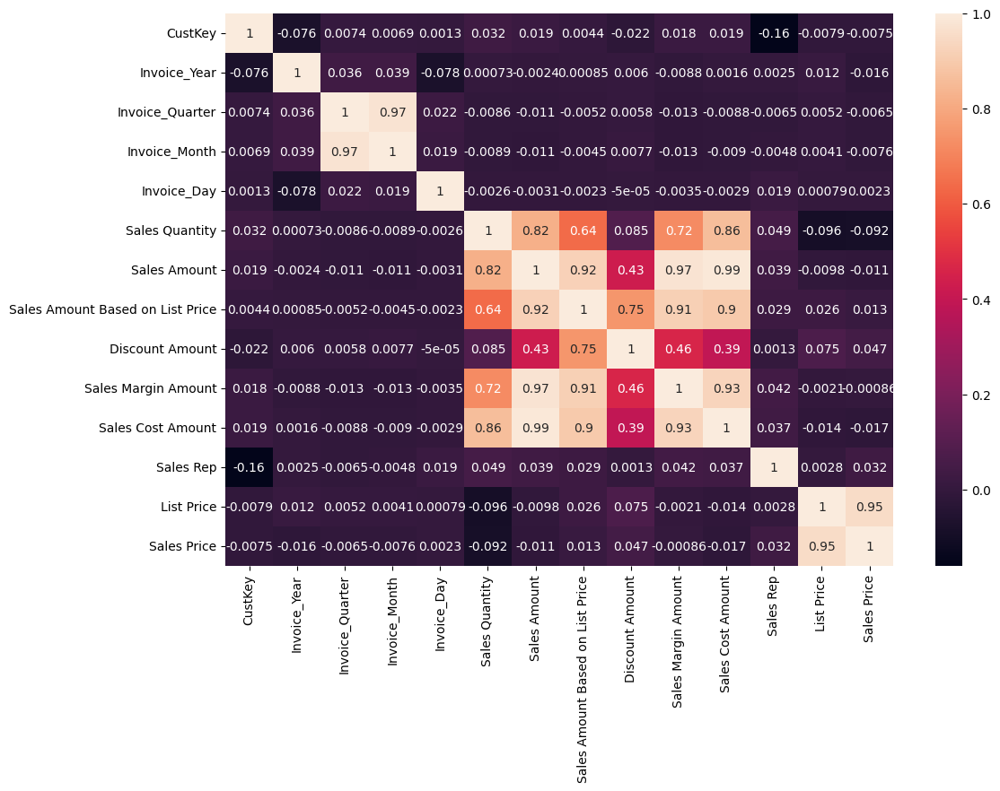

In [18]:
#Checking correlation

plt.figure(figsize=(12,8))
sns.heatmap(sales_data2.corr(),annot=True)

Findings:

1- Sales Amount is significantly related to Sales Amount, Sales Cost Amount, Sales Amount Based on List Price, and Sales Margin Amount, while Sales Quantity is marginally related.

2- The list price is closely related to the sales price and has no relationship with the sales amount, sales cost amount, sales amount based on the list price, or sales margin amount.

3- The relationship between sales number and sales amount, discount amount, and sales margin amount is minimal.

4- There is no relationship between the Sales Rep and the Sales Amount or the Sales Margin Amount.


In [19]:
sales_data2.head()

,CustKey,Item,Invoice Date,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,U/M,List Price,Sales Price
0,10000481,Urban Large Eggs,2017-04-30,2017,2,4,30,1,237.91,0.00,-237.91,237.91,0.0,184,EA,0.00,237.910000
1,10002220,Moms Sliced Turkey,2017-07-14,2017,3,7,14,1,456.17,824.96,368.79,456.17,0.0,127,EA,824.96,456.170000
2,10002220,Cutting Edge Foot-Long Hot Dogs,2017-10-17,2017,4,10,17,1,438.93,548.66,109.73,438.93,0.0,127,EA,548.66,438.930000
3,10002489,Kiwi Lox,2017-06-03,2017,2,6,3,1,211.75,0.00,-211.75,211.75,0.0,160,EA,0.00,211.750000
4,10004516,High Top Sweet Onion,2017-05-27,2017,2,5,27,455,89248.66,185876.60,96627.94,89248.66,0.0,124,SE,408.52,196.150901


In [20]:
sales_data2.shape

(65280, 17)

In [21]:
sales_data2.Item.value_counts()

Better Fancy Canned Sardines    1648
Ebony Prepared Salad            1471
Moms Sliced Turkey              1192
Imagine Popsicles               1191
Discover Manicotti              1126
                                ... 
Fast Salted Pretzels               1
Great Bagels                       1
Imagine Frozen Cauliflower         1
Jeffers Corn Puffs                 1
Bravo Fancy Canned Sardines        1
Name: Item, Length: 657, dtype: int64

Findings:
Highest number of sold Item is 'Better Fancy Canned Sardines'
Top 5 Items sold are:

1.Better Fancy Canned Sardines    1648

2.Ebony Prepared Salad            1471

3.Moms Sliced Turkey              1192

4.Imagine Popsicles               1191

5.Discover Manicotti              1126

In [22]:
sales_data2.describe()

,CustKey,Invoice_Year,Invoice_Quarter,Invoice_Month,Invoice_Day,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,6.528000e+04,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000,65280.000000
mean,1.001770e+07,2017.960907,2.414246,6.307001,16.155898,45.085708,2852.043002,4707.617837,1855.574835,1191.012887,1661.030116,137.423192,514.709149,283.696851
std,7.176244e+03,0.946607,1.160954,3.563558,8.795338,429.668301,15164.569043,20696.744425,9037.140888,5860.857507,9556.627220,26.643926,449.187029,252.031660
min,1.000045e+07,2017.000000,1.000000,1.000000,1.000000,1.000000,200.010000,0.000000,-255820.800000,-3932.930000,0.000000,103.000000,0.000000,0.337341
25%,1.001272e+07,2017.000000,1.000000,3.000000,9.000000,2.000000,308.380000,561.040000,246.037500,129.947500,167.790000,113.000000,181.560000,100.070000
50%,1.001966e+07,2018.000000,2.000000,6.000000,16.000000,3.000000,553.940000,998.160000,441.760000,246.490000,304.530000,134.000000,325.190000,183.758250
75%,1.002351e+07,2019.000000,3.000000,9.000000,24.000000,8.000000,1279.987500,2316.630000,999.760000,579.390000,687.400000,160.000000,803.860000,448.220000
max,1.002758e+07,2019.000000,4.000000,12.000000,31.000000,16000.000000,555376.000000,632610.160000,343532.660000,188800.000000,366576.000000,185.000000,2760.700000,6035.000000


In [24]:
pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.3/356.3 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 19.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=574cd32b81f2d0f94494518fae740c62b302d90346805dfaaf640846da884382
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

In [25]:
from pandas_profiling import ProfileReport

<ipython-input-25-e2a33329b6f0>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [26]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     / 22.6 MB 21.7 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=356305 sha256=8553753c2587f478b98d269a65f4be84ded9bf9250edee6fb4ef02c0dac79254
  Stored in directory: /tmp/pip-ephem-wheel-cache-20decahq/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
Successfully built ydata-profiling
  Attempting uninstall: ydata-profiling
    Found existing installation: ydata-profiling 4.4.0
    Uninstalling ydata-profiling-4.4.0:
      Successfully uninstalled ydata-profiling-4.4.0


In [27]:
profile = ProfileReport(sales_data2,explorative=True, dark_mode=True)

In [29]:
profile

In [30]:
profile.to_file('output.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
!pip install dtale

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.2/14.2 MB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 642.7/642.7 kB 30.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.7/219.7 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 68.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 71.9 MB/s eta 0:00:00
  Created wheel for dash-colorscales: filename=dash_colorscales-0.0.4-py3-none-any.whl size=62564 sha256=4553e2be4b

In [32]:
import dtale
dtale.show(sales_data2)

http://a16b9e75b10a:40000/dtale/main/1

In [33]:
sales_data2[[ 'List Price','Sales Price','Sales Amount Based on List Price','Sales Amount','Discount Amount']].head(16)

,List Price,Sales Price,Sales Amount Based on List Price,Sales Amount,Discount Amount
0,0.0000,237.910000,0.0000,237.91,-237.9100
1,824.9600,456.170000,824.9600,456.17,368.7900
2,548.6600,438.930000,548.6600,438.93,109.7300
3,0.0000,211.750000,0.0000,211.75,-211.7500
4,408.5200,196.150901,185876.6000,89248.66,96627.9400
5,0.0000,1950.000000,0.0000,1950.00,-1950.0000
6,795.3140,424.300000,795.3140,424.30,371.0140
7,575.0000,270.960000,1150.0000,541.92,608.0800
8,51.8800,23.560000,778.2000,353.40,424.8000
9,412.0300,187.150000,24721.8000,11229.00,13492.8000


Observation:
Discount Amount = (Sales Amount Based on List Price - Sales Amount)

Yearly Sales Record:

In [35]:
Yearly_Sales =  sales_data2[['CustKey','Item','Invoice Date','Invoice_Year','Invoice_Month',
                            'Sales Quantity', 'Sales Amount Based on List Price','Discount Amount',
                           'Sales Amount', 'Sales Margin Amount','Sales Cost Amount','Sales Rep','U/M','List Price',
                           'Sales Price']]

<ipython-input-36-5f92d60a3999>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Invoice_Year,Sales Amount
0,2017,87457304.54
1,2018,20817471.00
2,2019,77906591.65


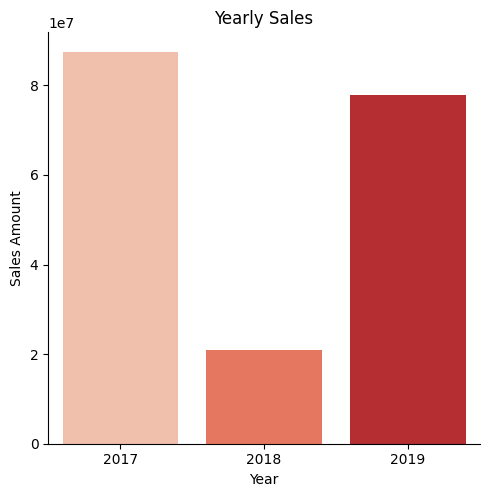

In [36]:
Yearly_Sales01 = Yearly_Sales.groupby('Invoice_Year').sum().reset_index()
sns.catplot(y = 'Sales Amount', x = 'Invoice_Year', data = Yearly_Sales01, palette='Reds',kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Amount')
plt.title('Yearly Sales')
Yearly_Sales01[['Invoice_Year', 'Sales Amount']]

<ipython-input-37-acfeb011a301>:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



<Axes: xlabel='Invoice_Month', ylabel='Sales Amount'>

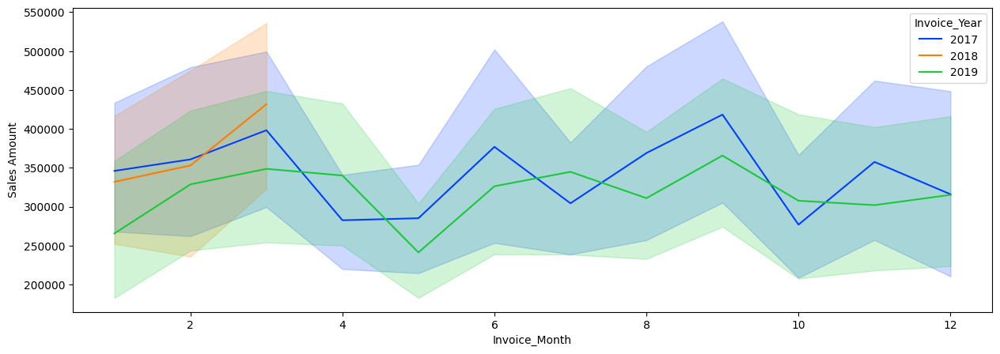

In [37]:
plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Amount', x = 'Invoice_Month',
             data= sales_data2.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')

Obseravtions:
From this plot, it is clear that Sales decreased continuously & then it started to increase from 2018 to 2019.

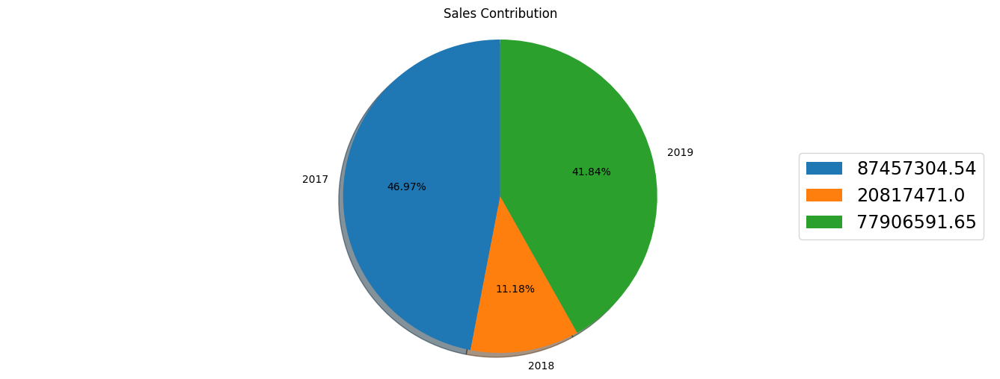

In [38]:
#Plotting Piechart to know Sales Share among 3 years
plt.figure(figsize=(17,6))
plt.pie('Sales Amount',labels='Invoice_Year',data=Yearly_Sales01,
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Sales Contribution')
plt.legend(round(Yearly_Sales01['Sales Amount'],2), loc=7, fontsize = 'xx-large')
plt.show()

Observations:
From 2017-19 Highest Sales Amount 2017>2019>2018.

Text(0, 0.5, 'Count')

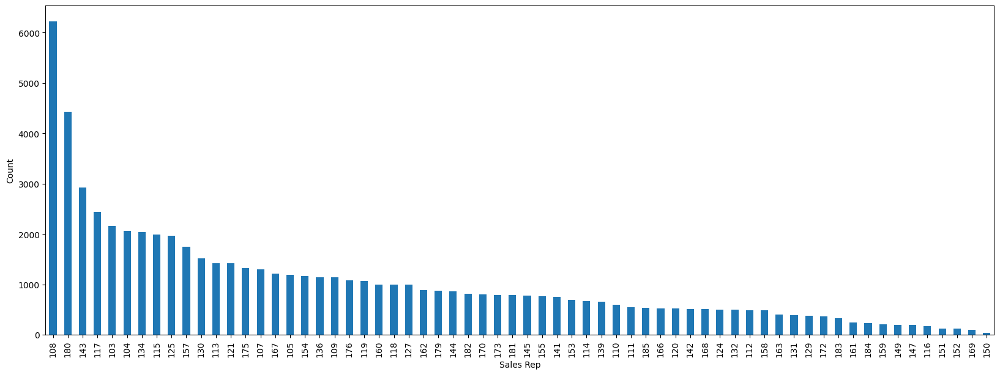

In [39]:
plt.figure(figsize=(20, 7))
sales_data2['Sales Rep'].value_counts().plot.bar()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

Sales Rep "108" were used most often while sales rep "150" has been used the least.

Yearly-Monthwise Records:

In [40]:
Yearly_Monthwise_Sales = sales_data2.groupby(['Invoice_Year','Invoice_Month']).sum().reset_index()
Yearly_Monthwise_Sales.iloc[:,6:].describe()

<ipython-input-40-05fc94b3f29e>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,27.000000,2.700000e+01,27.000000
mean,6.895606e+06,1.138197e+07,4.486368e+06,2.879604e+06,4.016002e+06,332258.740741,1.244452e+06,685915.941546
std,1.143812e+06,2.220965e+06,1.231585e+06,5.152791e+05,6.506092e+05,55396.534583,2.116445e+05,117490.201952
min,3.187481e+06,4.900167e+06,1.712686e+06,1.290189e+06,1.897292e+06,130314.000000,5.042254e+05,270807.438237
25%,6.461181e+06,1.077866e+07,4.024413e+06,2.622197e+06,3.688586e+06,306638.500000,1.143268e+06,620357.646119
50%,6.895858e+06,1.152212e+07,4.797025e+06,2.882060e+06,4.092856e+06,339909.000000,1.259842e+06,696506.820155
75%,7.600667e+06,1.278649e+07,5.277200e+06,3.134162e+06,4.370919e+06,366618.000000,1.365313e+06,753245.775603
max,8.786342e+06,1.472000e+07,6.112159e+06,3.810222e+06,5.041842e+06,404709.000000,1.558636e+06,876228.847969


**************************************************Yearly-Monthwise Sales Trend**************************************************


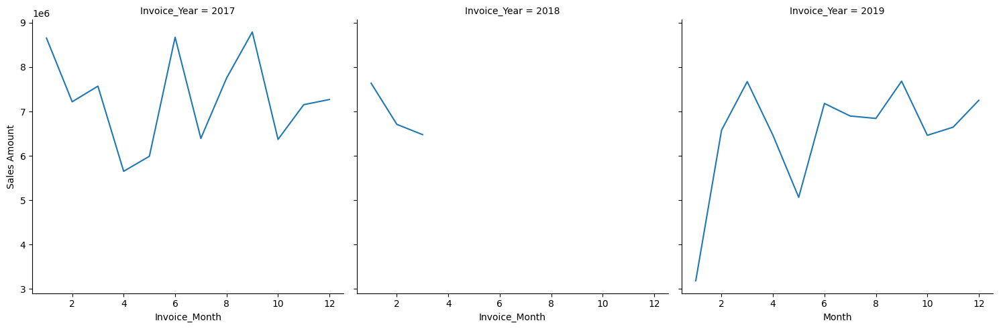

In [41]:
sns.relplot(x ='Invoice_Month',y = 'Sales Amount', data=Yearly_Monthwise_Sales,height=5,
            kind = 'line', aspect = 1, col = 'Invoice_Year')
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*50+'Yearly-Monthwise Sales Trend'+'*'*50)

<Axes: xlabel='Sales Amount', ylabel='Count'>

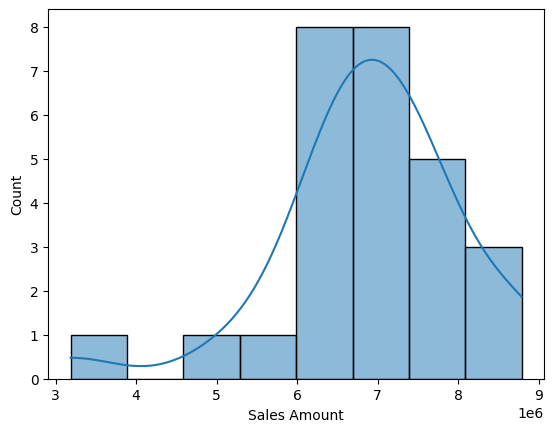

In [42]:
sns.histplot(Yearly_Monthwise_Sales['Sales Amount'], kde = True)

Monthly Records:

In [43]:
Monthly_sales = sales_data2.groupby(['Invoice_Year','Invoice_Month', 'Invoice_Day']).sum().reset_index()
Monthly_sales.iloc[:,5:].describe()

<ipython-input-43-dcecf86e3ed2>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Sales Quantity,Sales Amount,Sales Amount Based on List Price,Discount Amount,Sales Margin Amount,Sales Cost Amount,Sales Rep,List Price,Sales Price
count,559.000000,5.590000e+02,5.590000e+02,5.590000e+02,559.000000,559.000000,559.000000,559.000000,559.000000
mean,5265.107335,3.330615e+05,5.497554e+05,2.166940e+05,139086.442308,193975.037460,16048.275492,60107.716035,33130.108089
std,4781.445858,2.302024e+05,3.889088e+05,1.820144e+05,97025.174636,136009.114595,8052.820326,31837.127941,17179.276121
min,4.000000,5.433650e+03,0.000000e+00,-2.555238e+05,2349.360000,0.000000,345.000000,0.000000,1063.117667
25%,2106.500000,1.572531e+05,2.560595e+05,8.888978e+04,62655.095000,92237.325000,10063.000000,40370.544400,22084.687514
50%,3118.000000,2.688299e+05,4.487250e+05,1.630951e+05,113446.860000,150428.990000,14666.000000,54665.030000,30440.440019
75%,6577.000000,4.696801e+05,7.178838e+05,2.891977e+05,195474.320000,267013.720000,19652.500000,72573.307400,41211.201040
max,23710.000000,1.379283e+06,2.408920e+06,1.029636e+06,619085.330000,760197.860000,55866.000000,231196.720800,128415.923388


<ipython-input-44-c4a641e868f2>:1: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



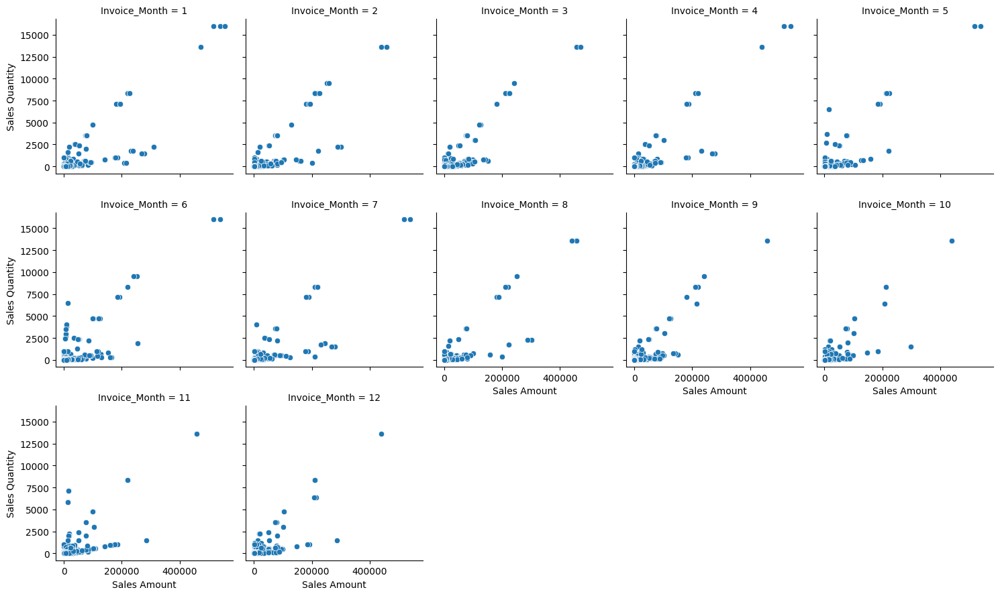

In [44]:
sns.relplot(y ='Sales Quantity',x = 'Sales Amount', data=sales_data2,height = 3,aspect=1,
            col = 'Invoice_Month',col_wrap=5, palette='muted')

**************************************************Monthly Sales Trend in 2017**************************************************


<Figure size 800x2000 with 0 Axes>

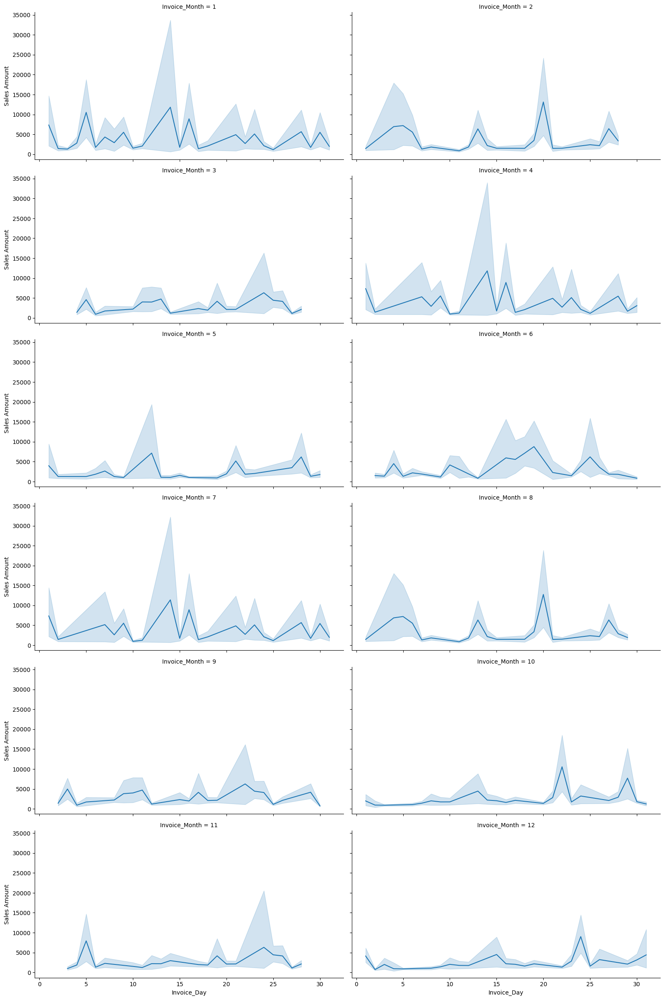

In [45]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2017'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2017'+'*'*50)

**************************************************Monthly Sales Trend in 2018**************************************************


<Figure size 800x2000 with 0 Axes>

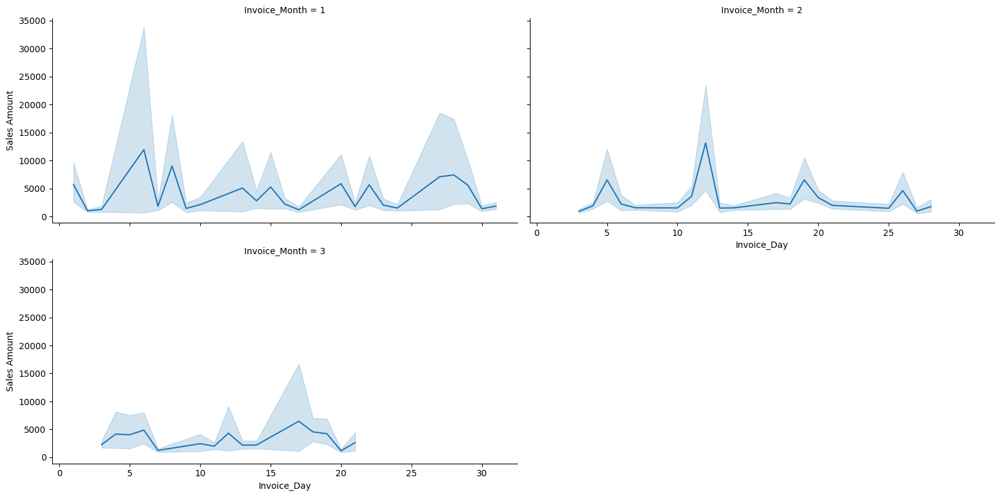

In [46]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2018'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2018'+'*'*50)

**************************************************Monthly Sales Trend in 2019**************************************************


<Figure size 800x2000 with 0 Axes>

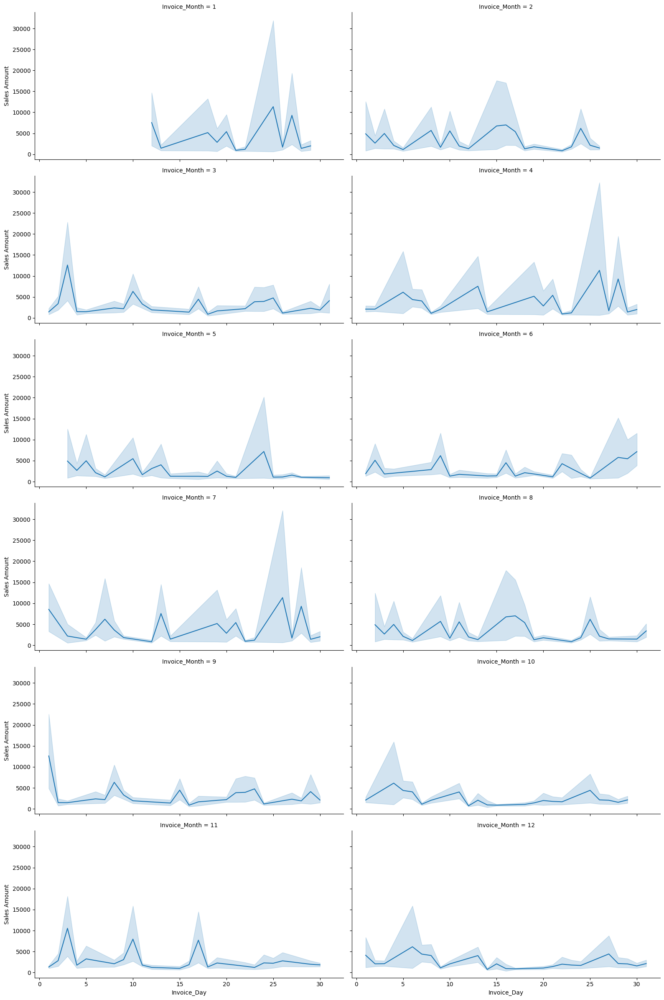

In [47]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= sales_data2.query('Invoice_Year == 2019'),
            kind = 'line', col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2019'+'*'*50)

Profit Records:

,Invoice_Year,Sales Margin Amount
0,2017,37419472.46
1,2018,9147547.74
2,2019,31182301.05


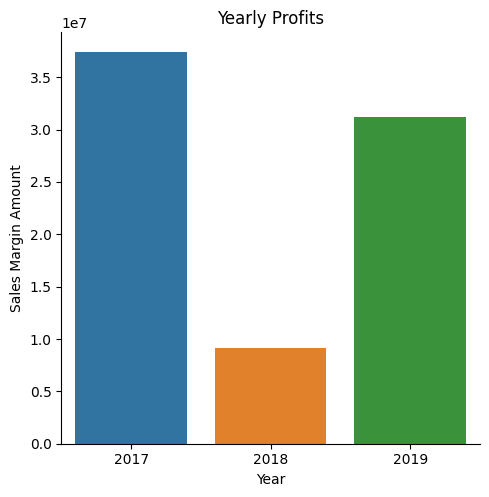

In [48]:
sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Year', data = Yearly_Sales01,kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Margin Amount')
plt.title('Yearly Profits')
Yearly_Sales01[['Invoice_Year', 'Sales Margin Amount']]

<ipython-input-49-2dfbcf0da19b>:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



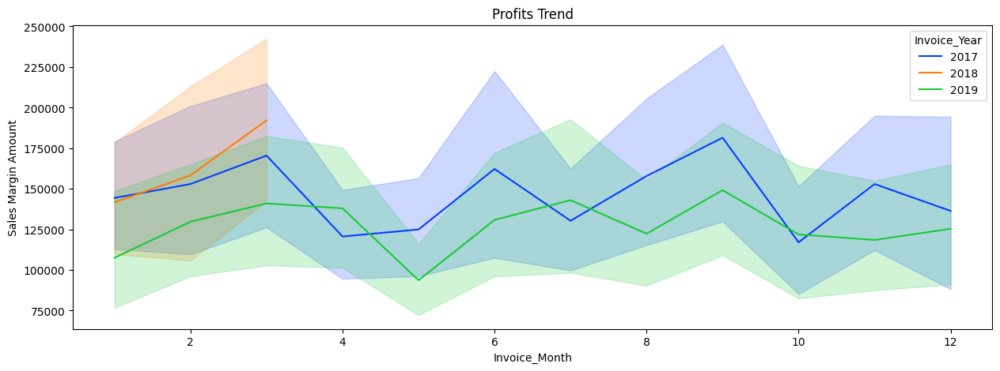

In [49]:
plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Margin Amount', x = 'Invoice_Month',
             data= sales_data2.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')
plt.title('Profits Trend')
plt.show()

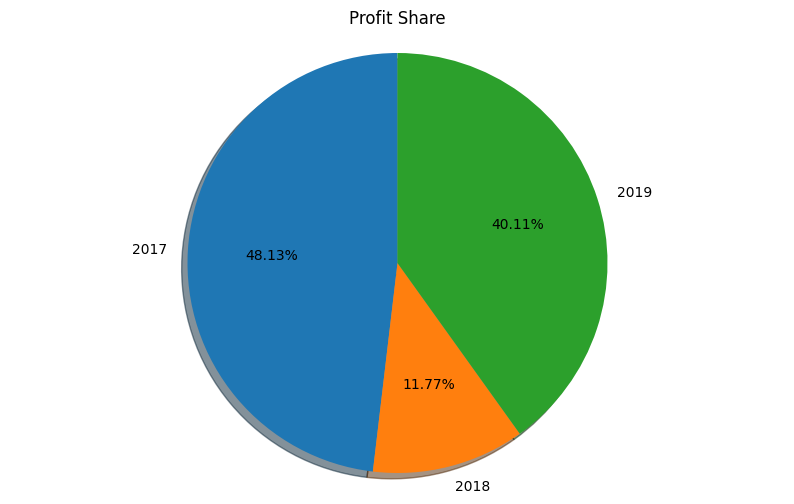

In [50]:
plt.figure(figsize=(10,6))
plt.pie('Sales Margin Amount',labels='Invoice_Year',data=Yearly_Sales01[['Invoice_Year', 'Sales Margin Amount']],
        autopct='%1.2f%%',shadow=True,startangle=90)
plt.axis('equal')
plt.title('Profit Share')
plt.show()

Top 10 Records:

In [53]:
Top10byCustKey17 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2017].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey17 = Top10byCustKey17.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

<ipython-input-53-e22e7fcae36a>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,CustKey,Sales Margin Amount
0,10021485,5176926.16
1,10025024,3250809.87
2,10025052,1761731.21
3,10025919,1415771.68
4,10025241,1267256.40
5,10023023,870216.36
6,10020184,843138.90
7,10009606,835041.55
8,10012715,782863.50
9,10023715,729615.06


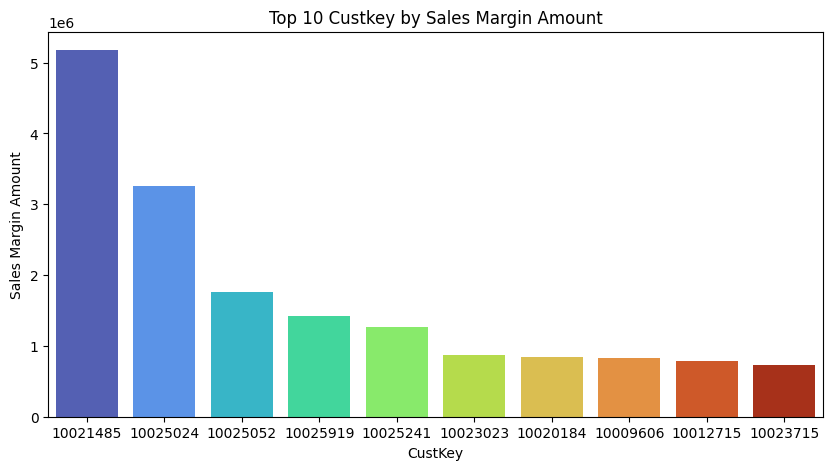

In [52]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey17, palette = 'turbo',
            order = Top10byCustKey17.CustKey)
plt.title('Top 10 Custkey by Sales Margin Amount')
Top10byCustKey17[['CustKey', 'Sales Margin Amount']]

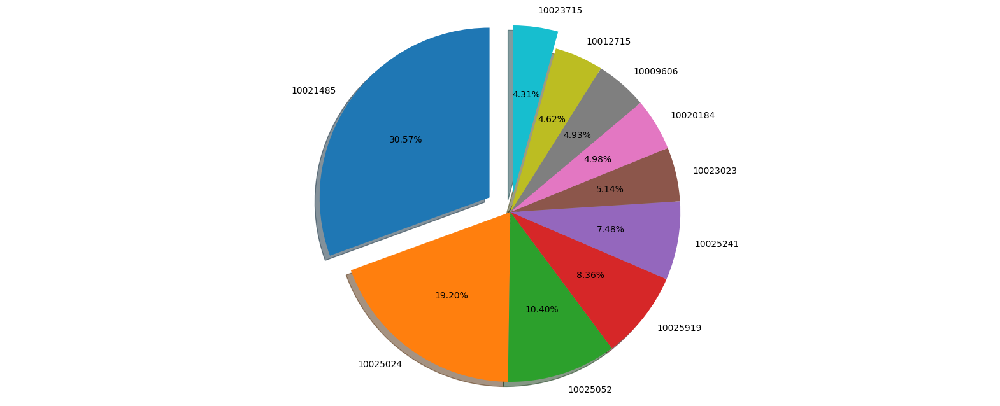

In [54]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey17,
        autopct='%1.2f%%',shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.show()

Observations:
Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10021485 contributed around 30.57% of the Sales Margin Amount in 2017.

In [55]:
Top10byCustKey18 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2018].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey18 = Top10byCustKey18.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

<ipython-input-55-ff33bb1d3c14>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,CustKey,Sales Margin Amount
0,10025039,1398188.29
1,10002154,1154085.14
2,10006919,509760.00
3,10025552,332110.69
4,10017638,233470.15
5,10019066,207997.56
6,10026299,195547.06
7,10023471,195034.39
8,10007183,162898.91
9,10010935,152253.65


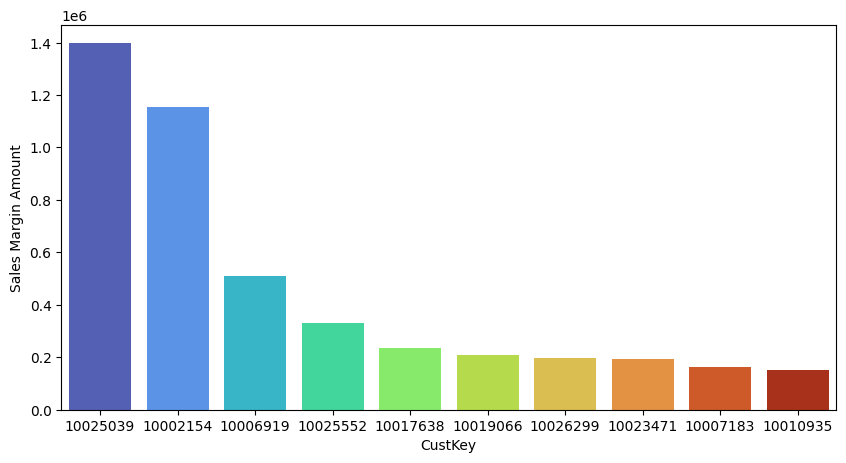

In [56]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey18, palette = 'turbo',
            order = Top10byCustKey18.CustKey)
Top10byCustKey18[['CustKey', 'Sales Margin Amount']]

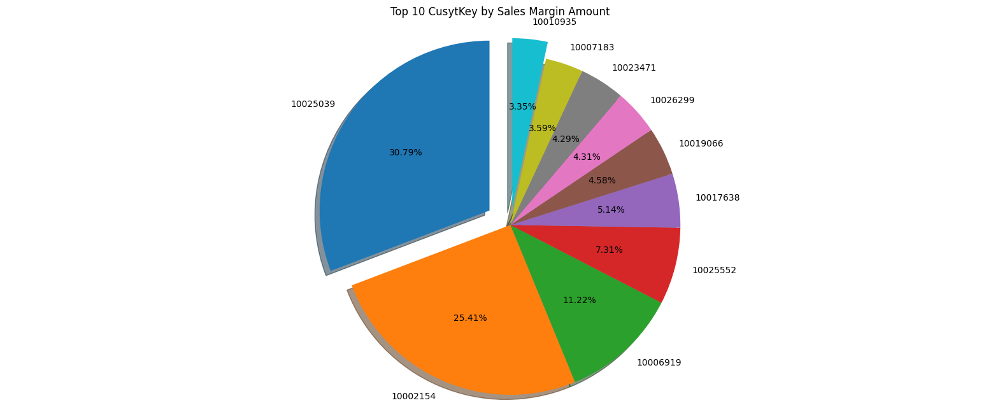

In [57]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey18,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 CusytKey by Sales Margin Amount')
plt.show()

Observations:
Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10025039 contributed around 30.79% of the Sales Margin Amount in 2018.

In [58]:
Top10byCustKey19 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2019].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey19 = Top10byCustKey19.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

<ipython-input-58-32d85246c2bb>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,CustKey,Sales Margin Amount
0,10009676,4473954.12
1,10021300,2840289.66
2,10025737,1544679.20
3,10019194,1221320.93
4,10025353,1114700.90
5,10025571,798919.82
6,10026606,712503.86
7,10012226,702720.45
8,10016548,683579.49
9,10004245,619735.78


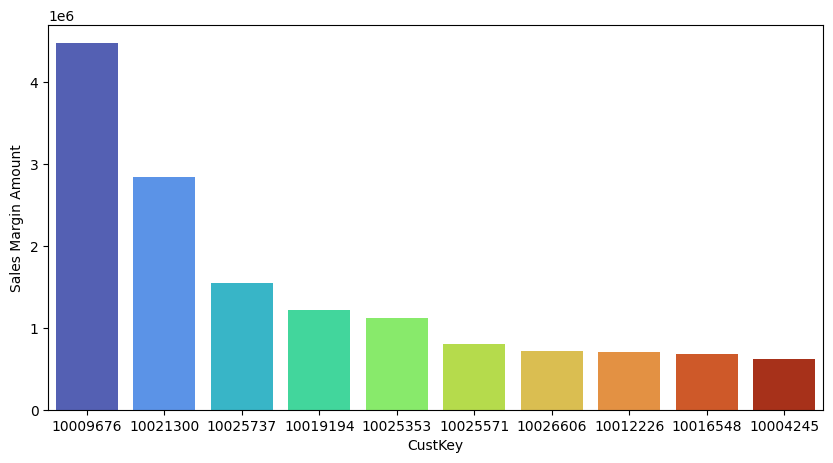

In [59]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey19, palette = 'turbo',
            order = Top10byCustKey19.CustKey)
Top10byCustKey19[['CustKey', 'Sales Margin Amount']]

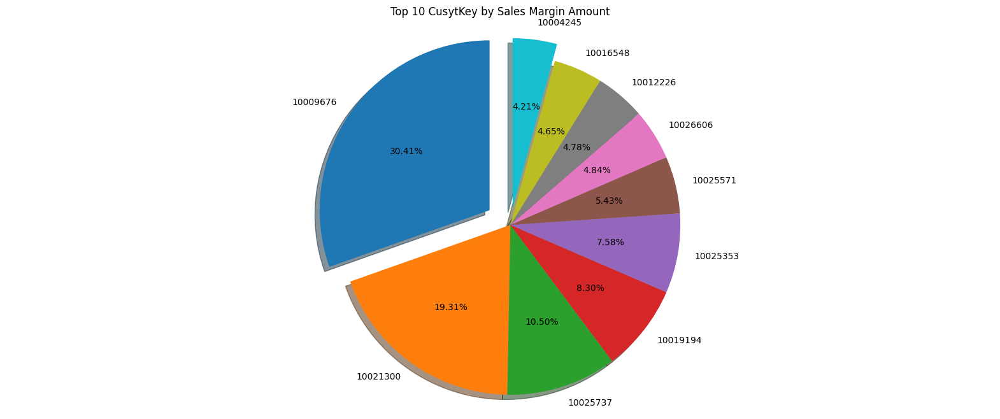

In [60]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey19,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 CusytKey by Sales Margin Amount')
plt.show()

Observations:
The 10 CustKey that generated the most Sales Margin Amount, CustKey-10009676 contributed around 30.41% of the Sales Margin Amount in 2019.